**1**

In [1]:
!pip install -U ultralytics roboflow pyyaml matplotlib opencv-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.6/46.6 kB 775.6 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 40.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.8/302.8 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.9/9.9 MB 108.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 67.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 118.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.4/58.4 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.1/78.1 kB 4.6 MB/s eta 0:00:00
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.10.0
    Uninstalling matplotlib-3.10.0:
      Successfully uninstalled matplotlib-3.10.0
  Attempting uninstall: typer
    Found existing installation: typer 0.27.2
    Uninstalling typer-0.27.2:
      Successf

In [1]:
import os
import glob
import yaml
import random
import shutil
from pathlib import Path

import matplotlib.pyplot as plt
import cv2
import torch

from ultralytics import YOLO

print("Ultralytics imported successfully!")
print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
else:
    print("⚠️ GPU not available. Enable GPU in Runtime → Change runtime type.")

Creating new Ultralytics Settings v0.0.8 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/usage/settings.
Ultralytics imported successfully!
PyTorch version: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


In [2]:
from google.colab import drive

drive.mount("/content/drive")

Mounted at /content/drive


In [3]:
PROJECT_ROOT = Path("/content/drive/MyDrive/PTM/trash_on_road_training")

PROJECT_ROOT.mkdir(parents=True, exist_ok=True)

print("Project directory:")
print(PROJECT_ROOT)

Project directory:
/content/drive/MyDrive/PTM/trash_on_road_training


In [5]:
from roboflow import Roboflow

ROBOFLOW_API_KEY = "XgnrdkrD2jrcSAiJoiHY"

rf = Roboflow(api_key=ROBOFLOW_API_KEY)

roadside_project = rf.workspace(
    "mariswary-deepak-4ajr0"
).project(
    "garbage-can-overflow"
)

roadside_version = roadside_project.version(1)

dataset = roadside_version.download(
    "yolov8",
    location="/content/raw_datasets/huge_roadside_trash"
)

DATASET_DIR = Path("/content/raw_datasets/huge_roadside_trash")

print("✅ Dataset downloaded!")
print("Dataset location:", DATASET_DIR)

loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to /content/raw_datasets/huge_roadside_trash in yolov8:: 100%|██████████| 3960/3960 [00:00<00:00, 4403.01it/s]

✅ Dataset downloaded!
Dataset location: /content/raw_datasets/huge_roadside_trash


In [6]:
print("Top-level contents:")

for item in sorted(DATASET_DIR.iterdir()):
    print(" -", item.name)

print("\nDirectory structure:")

for root, dirs, files in os.walk(DATASET_DIR):
    level = root.replace(str(DATASET_DIR), "").count(os.sep)

    if level <= 2:
        print("  " * level + os.path.basename(root) + "/")

Top-level contents:
 - README.dataset.txt
 - README.roboflow.txt
 - data.yaml
 - test
 - train
 - valid

Directory structure:
huge_roadside_trash/
  valid/
    images/
    labels/
  train/
    images/
    labels/
  test/
    images/
    labels/


In [7]:
yaml_files = list(DATASET_DIR.glob("*.yaml"))

print("YAML files found:")

for f in yaml_files:
    print(" -", f)

if not yaml_files:
    raise FileNotFoundError(
        f"No data.yaml found inside {DATASET_DIR}"
    )

DATA_YAML = yaml_files[0]

print("\nUsing:")
print(DATA_YAML)

YAML files found:
 - /content/raw_datasets/huge_roadside_trash/data.yaml

Using:
/content/raw_datasets/huge_roadside_trash/data.yaml


In [8]:
with open(DATA_YAML, "r") as f:
    data_config = yaml.safe_load(f)

print("data.yaml contents:\n")
print(yaml.safe_dump(data_config, sort_keys=False))

print("\nClasses:")
print(data_config.get("names"))

print("\nNumber of classes:")
print(data_config.get("nc"))

data.yaml contents:

names:
- Broken trash can
- Close_empty
- Close_full
- Healthy trash can
- Open_empty
- Open_full
- Trash flow
- closed
- empty
- full
nc: 10
roboflow:
  license: CC BY 4.0
  project: garbage-can-overflow
  url: https://universe.roboflow.com/mariswary-deepak-4ajr0/garbage-can-overflow/dataset/1
  version: 1
  workspace: mariswary-deepak-4ajr0
test: ../test/images
train: ../train/images
val: ../valid/images


Classes:
['Broken trash can', 'Close_empty', 'Close_full', 'Healthy trash can', 'Open_empty', 'Open_full', 'Trash flow', 'closed', 'empty', 'full']

Number of classes:
10


In [10]:
def resolve_split_dir(dataset_dir: Path, candidates):
    for name in candidates:
        p = dataset_dir / name / "images"
        if p.exists():
            return dataset_dir / name
    return None

train_split = resolve_split_dir(DATASET_DIR, ["train"])
val_split = resolve_split_dir(DATASET_DIR, ["valid", "val"])
test_split = resolve_split_dir(DATASET_DIR, ["test"])

TRAIN_DIR = (train_split / "images") if train_split else None
VAL_DIR = (val_split / "images") if val_split else None
TEST_DIR = (test_split / "images") if test_split else None

print("TRAIN_DIR:", TRAIN_DIR, "| exists:", TRAIN_DIR.exists() if TRAIN_DIR else False)
print("VAL_DIR:  ", VAL_DIR, "| exists:", VAL_DIR.exists() if VAL_DIR else False)
print("TEST_DIR: ", TEST_DIR, "| exists:", TEST_DIR.exists() if TEST_DIR else False)

if TRAIN_DIR is None or VAL_DIR is None:
    raise FileNotFoundError("Could not resolve train/valid split directories — check the dataset structure above.")


TRAIN_DIR: /content/raw_datasets/huge_roadside_trash/train/images | exists: True
VAL_DIR:   /content/raw_datasets/huge_roadside_trash/valid/images | exists: True
TEST_DIR:  /content/raw_datasets/huge_roadside_trash/test/images | exists: True


In [17]:
def count_images_labels(split_dir):
    if split_dir is None:
        return 0, 0
    image_dir = split_dir
    label_dir = split_dir.parent / "labels"
    n_images = len(list(image_dir.glob("*.*")))
    n_labels = len(list(label_dir.glob("*.txt"))) if label_dir.exists() else 0
    return n_images, n_labels

for name, split_dir in [("train", TRAIN_DIR), ("valid", VAL_DIR), ("test", TEST_DIR)]:
    n_img, n_lbl = count_images_labels(split_dir)
    print(f"{name:>6}: {n_img} images, {n_lbl} labels")


 train: 1185 images, 1185 labels
 valid: 253 images, 253 labels
  test: 536 images, 536 labels


In [12]:
def inspect_labels(split_dir, max_files=10):
    label_dir = split_dir.parent / "labels"
    files = sorted(label_dir.glob("*.txt"))[:max_files]

    print("Label directory:", label_dir)
    print("Files inspected:", len(files))

    for path in files:
        lines = [line.strip() for line in path.read_text().splitlines() if line.strip()]
        print("\n", path.name)
        for line in lines[:3]:
            parts = line.split()
            print(" token count:", len(parts))
            print(" ", line[:250])

inspect_labels(TRAIN_DIR)


Label directory: /content/raw_datasets/huge_roadside_trash/train/labels
Files inspected: 10

 -24-11-2021-234511_jpg.rf.325f36f620306b326004585a395fd08a.txt
 token count: 5
  9 0.509375 0.55078125 0.7796875 0.80546875

 -24-11-2021-234521_jpg.rf.977ddd38212f4ecf6817ceb1ba04f5c1.txt
 token count: 5
  9 0.47890625 0.621875 0.7625 0.6421875

 -24-11-2021-234544_jpg.rf.0ed3b499b960e1275480e39e711aaddc.txt
 token count: 5
  9 0.68515625 0.24453125 0.3796875 0.26875
 token count: 5
  9 0.65 0.3578125 0.396875 0.19609375
 token count: 5
  9 0.6828125 0.54375 0.546875 0.27265625

 -24-11-2021-234651_jpg.rf.0eadc6fa3fcaee2ca95baab7823f685e.txt
 token count: 5
  9 0.684375 0.63984375 0.63046875 0.7140625
 token count: 5
  9 0.33984375 0.596875 0.3375 0.80625
 token count: 5
  9 0.17265625 0.534375 0.19140625 0.73046875

 -24-11-2021-234750_jpg.rf.ef1c66a86ef04abe9087fd185d9f81f5.txt
 token count: 5
  9 0.61796875 0.525 0.74140625 0.7734375

 -24-11-2021-234800_jpg.rf.20cd0adfb59dfe3e5259ee0505dd

In [13]:
LABEL_DIR = TRAIN_DIR.parent / "labels"
label_files = list(LABEL_DIR.glob("*.txt"))

if not label_files:
    raise RuntimeError(f"No label files found in {LABEL_DIR}")

sample_label = label_files[0]
lines = [l for l in sample_label.read_text().splitlines() if l.strip()]
first_line_values = lines[0].split() if lines else []

IS_SEGMENTATION = len(first_line_values) > 5

print("Sample label file:", sample_label)
print("Values in first annotation line:", len(first_line_values))
print("Detected label format:", "segmentation" if IS_SEGMENTATION else "detection")


Sample label file: /content/raw_datasets/huge_roadside_trash/train/labels/-24-11-2021-235049_jpg.rf.80897572018e0c21a8036da29caef38a.txt
Values in first annotation line: 5
Detected label format: detection


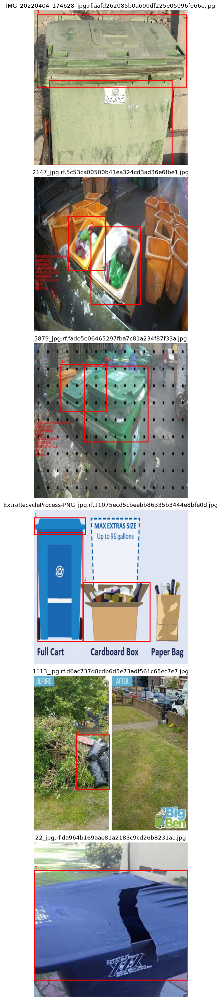

In [18]:
def get_image_files(image_dir, limit=None):
    image_dir = Path(image_dir)
    files = sorted([
        p for p in image_dir.iterdir()
        if p.is_file() and p.suffix.lower() in [".jpg", ".jpeg", ".png", ".bmp", ".webp"]
    ])
    return files

def show_samples(image_dir, n=6):
    image_dir = Path(image_dir)
    images = get_image_files(image_dir)

    if not images:
        print(f"No images found in: {image_dir}")
        return

    selected = random.sample(images, min(n, len(images)))
    label_dir = image_dir.parent / "labels"

    fig, axes = plt.subplots(len(selected), 1, figsize=(12, 5 * len(selected)))
    if len(selected) == 1:
        axes = [axes]

    for ax, image_path in zip(axes, selected):
        image = cv2.imread(str(image_path))
        if image is None:
            continue
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w = image.shape[:2]

        label_path = label_dir / f"{image_path.stem}.txt"
        ax.imshow(image)
        ax.set_title(image_path.name)
        ax.axis("off")

        if label_path.exists():
            lines = [line.strip() for line in label_path.read_text().splitlines() if line.strip()]
            for line in lines:
                parts = list(map(float, line.split()))
                cls = int(parts[0])
                coords = parts[1:]

                if len(coords) == 4:
                    # YOLO detection box: x_center, y_center, width, height (normalized)
                    xc, yc, bw, bh = coords
                    x1 = (xc - bw / 2) * w
                    y1 = (yc - bh / 2) * h
                    rect = plt.Rectangle((x1, y1), bw * w, bh * h, fill=False, linewidth=2, edgecolor="red")
                    ax.add_patch(rect)
                    ax.text(x1, max(y1 - 5, 0), str(cls), color="red", fontsize=10)

                elif len(coords) >= 6 and len(coords) % 2 == 0:
                    # YOLO segmentation polygon
                    pts = [(coords[i] * w, coords[i + 1] * h) for i in range(0, len(coords), 2)]
                    if len(pts) >= 3:
                        polygon = plt.Polygon(pts, fill=False, linewidth=2, edgecolor="red")
                        ax.add_patch(polygon)

    plt.tight_layout()
    plt.show()

show_samples(TRAIN_DIR, n=6)


In [20]:
# ---- Class filter configuration -------------------------------------------------
# Edit this dict if you want to keep/drop different original classes.

KEEP_MAP = {
    "Broken trash can": "broken_bin",
    "Close_full":   "overflowing_bin",
    "Open_full":    "overflowing_bin",
    "full":         "overflowing_bin",
    "Trash flow":   "trash_on_road",
}

NEW_CLASSES = ["broken_bin","overflowing_bin", "trash_on_road"]
NEW_CLASS_ID = {name: i for i, name in enumerate(NEW_CLASSES)}

# Original names come straight from the Roboflow data.yaml loaded in Step 7
ORIGINAL_NAMES = data_config["names"]
if isinstance(ORIGINAL_NAMES, dict):
    ORIGINAL_NAMES = [ORIGINAL_NAMES[k] for k in sorted(ORIGINAL_NAMES)]

OLD_ID_TO_NEW_ID = {}
for old_id, old_name in enumerate(ORIGINAL_NAMES):
    if old_name in KEEP_MAP:
        OLD_ID_TO_NEW_ID[old_id] = NEW_CLASS_ID[KEEP_MAP[old_name]]

print("Original classes:")
for i, n in enumerate(ORIGINAL_NAMES):
    tag = f"KEEP -> {KEEP_MAP[n]} ({OLD_ID_TO_NEW_ID[i]})" if n in KEEP_MAP else "drop"
    print(f"  {i:>2}  {n:<20} {tag}")

print("\nNew classes:", NEW_CLASSES)

missing = [n for n in KEEP_MAP if n not in ORIGINAL_NAMES]
if missing:
    raise ValueError(f"These KEEP_MAP names are not in data.yaml: {missing}")

Original classes:
   0  Broken trash can     KEEP -> broken_bin (0)
   1  Close_empty          drop
   2  Close_full           KEEP -> overflowing_bin (1)
   3  Healthy trash can    drop
   4  Open_empty           drop
   5  Open_full            KEEP -> overflowing_bin (1)
   6  Trash flow           KEEP -> trash_on_road (2)
   7  closed               drop
   8  empty                drop
   9  full                 KEEP -> overflowing_bin (1)

New classes: ['broken_bin', 'overflowing_bin', 'trash_on_road']


In [44]:
from collections import Counter

FILTERED_DIR = Path("/content/datasets/trash_filtered")
IMAGE_EXTS = [".jpg", ".jpeg", ".png", ".bmp", ".webp"]

# Fraction of background (no-object) images to keep, relative to positives.
# 0.12 => roughly 12% of the split is backgrounds. Ultralytics suggests 0-10%;
# keep it modest or the model gets shy.
BACKGROUND_RATIO = 0.12

# Original class names that make the most useful negatives: clean bins the
# model must learn NOT to call "overflowing".
BACKGROUND_PRIORITY_NAMES = {
    "Close_empty", "Open_empty", "Healthy trash can", "closed", "empty",
}
BACKGROUND_PRIORITY_IDS = {
    i for i, n in enumerate(ORIGINAL_NAMES) if n in BACKGROUND_PRIORITY_NAMES
}

SPLITS = {
    "train": TRAIN_DIR,
    "valid": VAL_DIR,
    "test":  TEST_DIR,
}

random.seed(0)


def filter_split(split_name, image_dir):
    """Keep images with a target class; keep a subset of clean-bin images as backgrounds."""
    if image_dir is None or not Path(image_dir).exists():
        print(f"{split_name}: skipped (not present)")
        return Counter()

    image_dir = Path(image_dir)
    label_dir = image_dir.parent / "labels"

    out_img = FILTERED_DIR / split_name / "images"
    out_lbl = FILTERED_DIR / split_name / "labels"
    out_img.mkdir(parents=True, exist_ok=True)
    out_lbl.mkdir(parents=True, exist_ok=True)

    counts = Counter()
    kept_images = 0
    bg_priority = []   # clean/empty/healthy bins -> best negatives
    bg_other = []      # annotated, but nothing we care about
    no_label = 0

    for img_path in sorted(image_dir.iterdir()):
        if img_path.suffix.lower() not in IMAGE_EXTS:
            continue

        label_path = label_dir / f"{img_path.stem}.txt"
        if not label_path.exists():
            no_label += 1
            continue

        kept_lines = []
        original_ids = set()
        for line in label_path.read_text().splitlines():
            line = line.strip()
            if not line:
                continue
            parts = line.split()
            old_id = int(float(parts[0]))
            original_ids.add(old_id)
            if old_id in OLD_ID_TO_NEW_ID:
                new_id = OLD_ID_TO_NEW_ID[old_id]
                kept_lines.append(" ".join([str(new_id)] + parts[1:]))
                counts[NEW_CLASSES[new_id]] += 1

        if kept_lines:
            shutil.copy2(img_path, out_img / img_path.name)
            (out_lbl / f"{img_path.stem}.txt").write_text("\n".join(kept_lines) + "\n")
            kept_images += 1
        elif original_ids & BACKGROUND_PRIORITY_IDS:
            bg_priority.append(img_path)
        else:
            bg_other.append(img_path)

    # Choose backgrounds: clean bins first, top up with the rest if needed.
    n_bg = int(round(BACKGROUND_RATIO * kept_images))
    random.shuffle(bg_priority)
    random.shuffle(bg_other)
    chosen_bg = (bg_priority + bg_other)[:n_bg]

    for img_path in chosen_bg:
        shutil.copy2(img_path, out_img / img_path.name)
        (out_lbl / f"{img_path.stem}.txt").write_text("")   # empty label = background

    print(
        f"{split_name:>6}: {kept_images} positive, {len(chosen_bg)} background "
        f"(from {len(bg_priority)} clean-bin + {len(bg_other)} other candidates), "
        f"{no_label} unlabelled skipped"
    )
    for cls, c in counts.items():
        print(f"         {cls}: {c} boxes")
    return counts


if FILTERED_DIR.exists():
    shutil.rmtree(FILTERED_DIR)

total = Counter()
for split_name, image_dir in SPLITS.items():
    total += filter_split(split_name, image_dir)

print("\nTotal boxes after filtering:")
for cls in NEW_CLASSES:
    print(f"  {cls}: {total[cls]}")

if sum(total.values()) == 0:
    raise RuntimeError("Filtering removed everything — check KEEP_MAP.")

 train: 677 positive, 81 background (from 363 clean-bin + 145 other candidates), 0 unlabelled skipped
         overflowing_bin: 601 boxes
         broken_bin: 160 boxes
         trash_on_road: 337 boxes
 valid: 124 positive, 15 background (from 85 clean-bin + 44 other candidates), 0 unlabelled skipped
         overflowing_bin: 82 boxes
         broken_bin: 21 boxes
         trash_on_road: 94 boxes
  test: 346 positive, 42 background (from 167 clean-bin + 23 other candidates), 0 unlabelled skipped
         trash_on_road: 189 boxes
         overflowing_bin: 290 boxes
         broken_bin: 170 boxes

Total boxes after filtering:
  broken_bin: 351
  overflowing_bin: 973
  trash_on_road: 620


In [45]:
VAL_FRACTION = 0.18

def base_group(stem: str) -> str:
    """Roboflow names look like '<original>_jpg.rf.<hash>'. Group on the original."""
    return stem.split(".rf.")[0]

# Pool everything currently in train + valid
pool = {}   # group -> list of (image_path, label_path)
for split in ["train", "valid"]:
    img_dir = FILTERED_DIR / split / "images"
    lbl_dir = FILTERED_DIR / split / "labels"
    if not img_dir.exists():
        continue
    for img in sorted(img_dir.iterdir()):
        if img.suffix.lower() not in IMAGE_EXTS:
            continue
        lbl = lbl_dir / f"{img.stem}.txt"
        pool.setdefault(base_group(img.stem), []).append((img, lbl))

groups = sorted(pool.keys())
random.Random(42).shuffle(groups)

total_images = sum(len(v) for v in pool.values())
target_val = int(round(VAL_FRACTION * total_images))

val_groups, n_val = set(), 0
for g in groups:
    if n_val >= target_val:
        break
    val_groups.add(g)
    n_val += len(pool[g])

# Stage the new split, then swap it in
STAGING = Path("/content/datasets/_resplit")
if STAGING.exists():
    shutil.rmtree(STAGING)
for split in ["train", "valid"]:
    (STAGING / split / "images").mkdir(parents=True, exist_ok=True)
    (STAGING / split / "labels").mkdir(parents=True, exist_ok=True)

for g, items in pool.items():
    split = "valid" if g in val_groups else "train"
    for img, lbl in items:
        shutil.copy2(img, STAGING / split / "images" / img.name)
        shutil.copy2(lbl, STAGING / split / "labels" / lbl.name)

for split in ["train", "valid"]:
    shutil.rmtree(FILTERED_DIR / split)
    shutil.move(str(STAGING / split), str(FILTERED_DIR / split))
shutil.rmtree(STAGING, ignore_errors=True)

FILTERED_TRAIN = FILTERED_DIR / "train" / "images"
FILTERED_VAL   = FILTERED_DIR / "valid" / "images"
FILTERED_TEST  = FILTERED_DIR / "test"  / "images"

print(f"Re-split {total_images} images across {len(groups)} source photos "
      f"({len(val_groups)} photos held out for validation)\n")

Re-split 897 images across 879 source photos (158 photos held out for validation)



In [46]:
valid_ids = set(range(len(NEW_CLASSES)))
bad_ids, split_groups = [], {}

for split in ["train", "valid", "test"]:
    img_dir = FILTERED_DIR / split / "images"
    lbl_dir = FILTERED_DIR / split / "labels"
    if not img_dir.exists():
        print(f"{split:>6}: missing")
        continue

    n_img = len([p for p in img_dir.iterdir() if p.suffix.lower() in IMAGE_EXTS])
    per_class, n_bg = Counter(), 0
    split_groups[split] = set()

    for lbl in sorted(lbl_dir.glob("*.txt")):
        split_groups[split].add(base_group(lbl.stem))
        lines = [l for l in lbl.read_text().splitlines() if l.strip()]
        if not lines:
            n_bg += 1
            continue
        for line in lines:
            cid = int(float(line.split()[0]))
            if cid in valid_ids:
                per_class[NEW_CLASSES[cid]] += 1
            else:
                bad_ids.append((lbl.name, cid))

    print(f"{split:>6}: {n_img} images ({n_bg} background, "
          f"{100*n_bg/max(n_img,1):.0f}%)")
    for cls in NEW_CLASSES:
        print(f"         {cls}: {per_class[cls]} boxes")

print("\nInvalid class ids:", len(bad_ids), bad_ids[:5])

overlap = split_groups.get("train", set()) & split_groups.get("valid", set())
print("Source photos shared between train and valid:", len(overlap))
if overlap:
    raise RuntimeError("Leakage — the same photo appears in both splits.")

for split in ["train", "valid"]:
    if not (FILTERED_DIR / split / "images").exists() or not split_groups.get(split):
        raise RuntimeError(f"{split} split is empty.")

 train: 736 images (78 background, 11%)
         broken_bin: 155 boxes
         overflowing_bin: 557 boxes
         trash_on_road: 355 boxes
 valid: 161 images (18 background, 11%)
         broken_bin: 26 boxes
         overflowing_bin: 126 boxes
         trash_on_road: 76 boxes
  test: 388 images (42 background, 11%)
         broken_bin: 170 boxes
         overflowing_bin: 290 boxes
         trash_on_road: 189 boxes

Invalid class ids: 0 []
Source photos shared between train and valid: 0


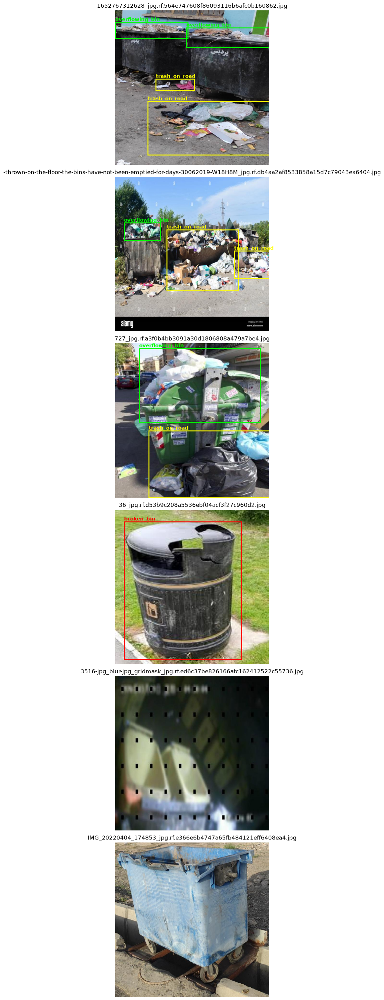

In [47]:
COLORS = {0: "red", 1: "lime"}

def show_filtered_samples(image_dir, n=6):
    image_dir = Path(image_dir)
    images = get_image_files(image_dir)

    if not images:
        print(f"No images found in: {image_dir}")
        return

    selected = random.sample(images, min(n, len(images)))
    label_dir = image_dir.parent / "labels"

    fig, axes = plt.subplots(len(selected), 1, figsize=(12, 5 * len(selected)))
    if len(selected) == 1:
        axes = [axes]

    for ax, image_path in zip(axes, selected):
        image = cv2.imread(str(image_path))
        if image is None:
            continue
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        h, w = image.shape[:2]

        ax.imshow(image)
        ax.set_title(image_path.name)
        ax.axis("off")

        label_path = label_dir / f"{image_path.stem}.txt"
        if label_path.exists():
            for line in label_path.read_text().splitlines():
                if not line.strip():
                    continue
                parts = list(map(float, line.split()))
                cls = int(parts[0])
                coords = parts[1:]
                color = COLORS.get(cls, "yellow")

                if len(coords) == 4:
                    xc, yc, bw, bh = coords
                    x1 = (xc - bw / 2) * w
                    y1 = (yc - bh / 2) * h
                    ax.add_patch(plt.Rectangle((x1, y1), bw * w, bh * h,
                                               fill=False, linewidth=2, edgecolor=color))
                    ax.text(x1, max(y1 - 5, 0), NEW_CLASSES[cls],
                            color=color, fontsize=11, weight="bold")

                elif len(coords) >= 6 and len(coords) % 2 == 0:
                    pts = [(coords[i] * w, coords[i + 1] * h) for i in range(0, len(coords), 2)]
                    ax.add_patch(plt.Polygon(pts, fill=False, linewidth=2, edgecolor=color))

    plt.tight_layout()
    plt.show()

show_filtered_samples(FILTERED_TRAIN, n=6)

In [48]:
local_config = {
    "path": str(FILTERED_DIR),
    "train": "train/images",
    "val": "valid/images",
    "test": "test/images",
    "names": {i: name for i, name in enumerate(NEW_CLASSES)},
}

local_yaml_path = "/content/trash_on_road.yaml"

with open(local_yaml_path, "w") as f:
    yaml.safe_dump(local_config, f, sort_keys=False)

print(open(local_yaml_path).read())

path: /content/datasets/trash_filtered
train: train/images
val: valid/images
test: test/images
names:
  0: broken_bin
  1: overflowing_bin
  2: trash_on_road



In [49]:
# n (2.5M params) plateaued at mAP50-95 0.562. s is ~4x the capacity and still
# trains comfortably on a T4. Bump to "yolo26m.pt" if you have an A100/L4.
MODEL_SIZE = "s"

MODEL_WEIGHTS = (
    f"yolo26{MODEL_SIZE}-seg.pt" if IS_SEGMENTATION else f"yolo26{MODEL_SIZE}.pt"
)

print("Detected label format:", "segmentation" if IS_SEGMENTATION else "detection")
print("Model:", MODEL_WEIGHTS)

# Fallback for older ultralytics versions:
# MODEL_WEIGHTS = "yolov8s.pt"

Detected label format: detection
Model: yolo26s.pt


In [51]:
from ultralytics import YOLO

RUN_PROJECT = "/content/drive/MyDrive/PTM/trash_on_road_training"
RUN_NAME = "trash_overflow_v1_100_2"

model = YOLO(MODEL_WEIGHTS)

results = model.train(
    data=local_yaml_path,
    epochs=100,
    imgsz=640,
    batch=16,
    device=0,
    workers=2,
    project=RUN_PROJECT,
    name=RUN_NAME,
    exist_ok=True
)

print("✅ Training completed.")

Ultralytics 8.4.153 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, channels_last=None, classes=None, close_mosaic=10, cls=0.5, cls_pw=0.0, cls_remap=True, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/trash_on_road.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dgrad=0.5, dis=6.0, distill_model=None, dlam=1.0, dlog=1.0, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo26s.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=trash_overflow_v1_100_2, nbs=64, nms=None, opset

In [ ]:
# from ultralytics import YOLO
#
# checkpoint = f"{RUN_PROJECT}/{RUN_NAME}/weights/last.pt"
# model = YOLO(checkpoint)
# results = model.train(resume=True)
#
# print("✅ Training resumed/completed.")

In [52]:
best_model_path = f"{RUN_PROJECT}/{RUN_NAME}/weights/best.pt"

if not os.path.exists(best_model_path):
    raise FileNotFoundError(f"best.pt not found: {best_model_path}")

trained_model = YOLO(best_model_path)

metrics = trained_model.val(
    data=local_yaml_path,
    imgsz=640,
    batch=16,
    device=0
)

print(metrics)

Ultralytics 8.4.153 🚀 Python-3.13.15 torch-2.11.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
YOLO26s summary (fused): 120 layers, 9,466,341 parameters, 0 gradients, 20.8 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 1873.4±510.8 MB/s, size: 54.8 KB)
val: Scanning /content/datasets/trash_filtered/valid/labels.cache... 161 images, 18 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 161/161 56.3Mit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 11/11 1.6it/s 6.9s
                   all        161        228      0.753      0.686      0.743      0.539
            broken_bin         24         26      0.706      0.769      0.761      0.623
       overflowing_bin         74        126      0.713      0.603      0.697      0.491
         trash_on_road         64         76      0.841      0.684      0.771      0.503
Speed: 7.2ms preprocess, 14.6ms inference, 0.0ms loss, 4.5ms postprocess per image
Results saved to /content/runs/de

In [53]:
try:
    print("Precision:", metrics.results_dict.get("metrics/precision(B)"))
    print("Recall:   ", metrics.results_dict.get("metrics/recall(B)"))
    print("mAP50:    ", metrics.results_dict.get("metrics/mAP50(B)"))
    print("mAP50-95: ", metrics.results_dict.get("metrics/mAP50-95(B)"))
except Exception as e:
    print("Could not extract box metrics directly.")
    print(e)
    print(metrics.results_dict)

try:
    print("\nPer-class mAP50-95:")
    for i, ap in enumerate(metrics.box.maps):
        print(f"  {NEW_CLASSES[i]}: {ap:.4f}")
except Exception as e:
    print("Per-class metrics unavailable:", e)

Precision: 0.753300444775593
Recall:    0.685538632907054
mAP50:     0.7430069660453077
mAP50-95:  0.5388832690472329

Per-class mAP50-95:
  broken_bin: 0.6233
  overflowing_bin: 0.4908
  trash_on_road: 0.5026


In [54]:
CUSTOM_FOLDER = "/content/drive/MyDrive/PTM/images/trash"

results = trained_model.predict(
    source=CUSTOM_FOLDER,
    conf=0.25,
    save=True
)


image 1/21 /content/drive/MyDrive/PTM/images/trash/p1.jpg: 640x544 2 overflowing_bins, 4 trash_on_roads, 64.0ms
image 2/21 /content/drive/MyDrive/PTM/images/trash/p10.jpg: 448x640 1 overflowing_bin, 49.7ms
image 3/21 /content/drive/MyDrive/PTM/images/trash/p11.jpg: 416x640 1 trash_on_road, 50.1ms
image 4/21 /content/drive/MyDrive/PTM/images/trash/p12.jpg: 384x640 2 trash_on_roads, 51.9ms
image 5/21 /content/drive/MyDrive/PTM/images/trash/p13.jpg: 640x640 1 trash_on_road, 16.8ms
image 6/21 /content/drive/MyDrive/PTM/images/trash/p14.jpg: 448x640 1 trash_on_road, 13.0ms
image 7/21 /content/drive/MyDrive/PTM/images/trash/p15.jpg: 384x640 1 trash_on_road, 11.7ms
image 8/21 /content/drive/MyDrive/PTM/images/trash/p16.jpg: 480x640 (no detections), 50.0ms
image 9/21 /content/drive/MyDrive/PTM/images/trash/p17.jpg: 640x448 1 overflowing_bin, 49.4ms
image 10/21 /content/drive/MyDrive/PTM/images/trash/p18.jpg: 640x352 1 broken_bin, 51.7ms
image 11/21 /content/drive/MyDrive/PTM/images/trash/p19.

Total images: 21


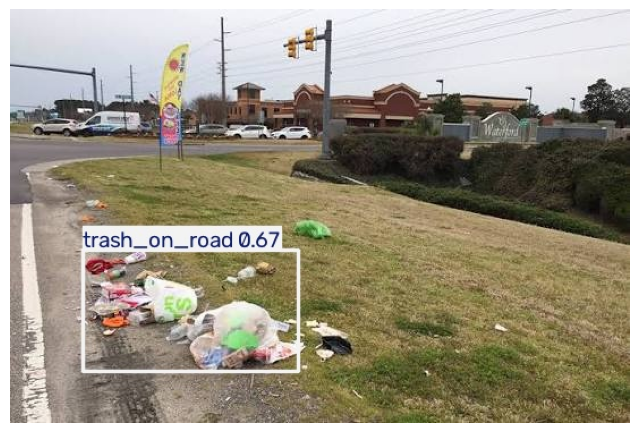

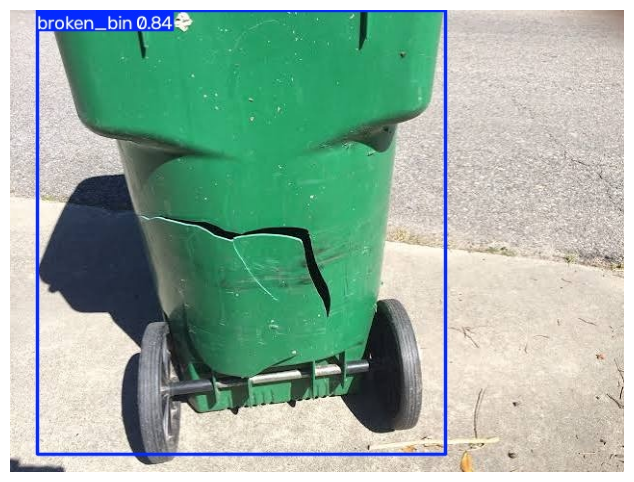

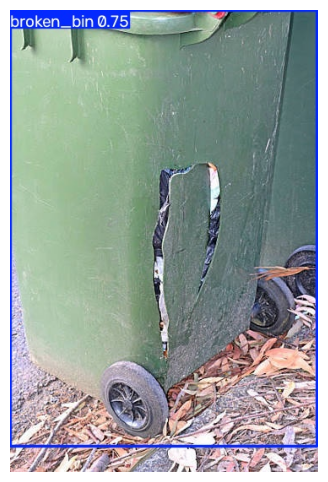

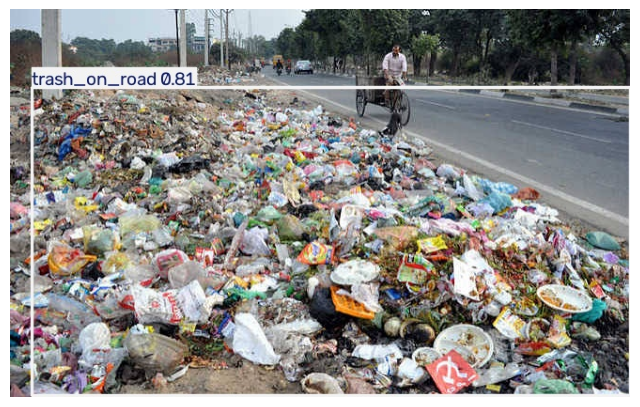

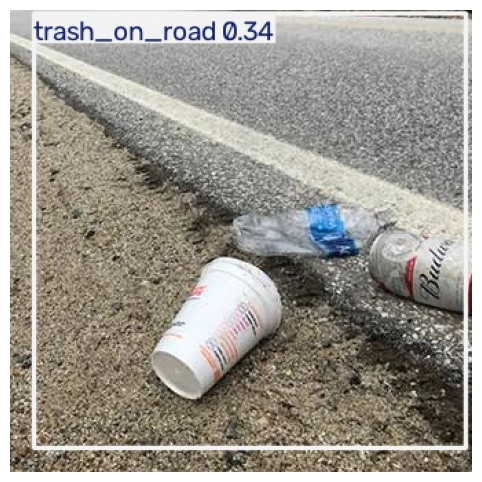

...

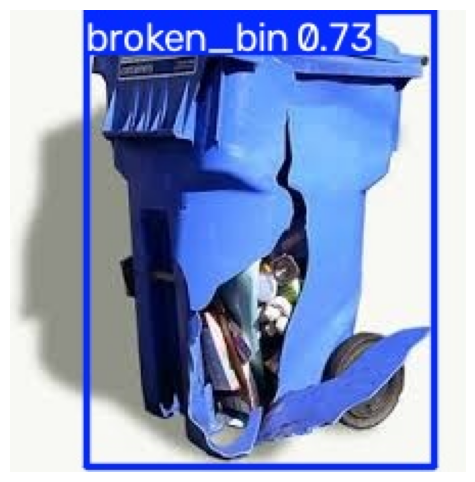

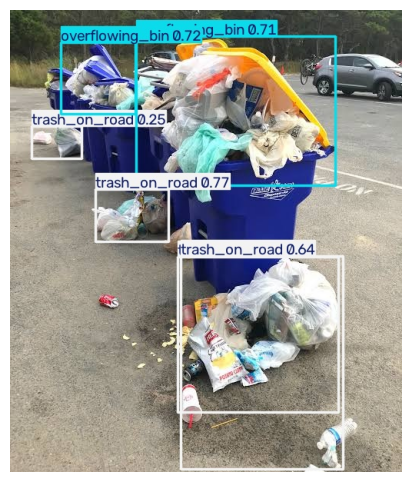

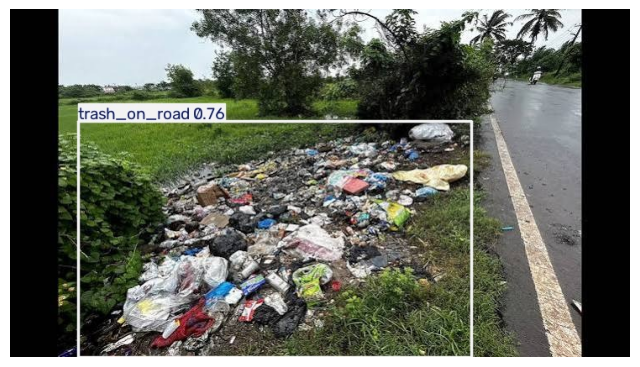

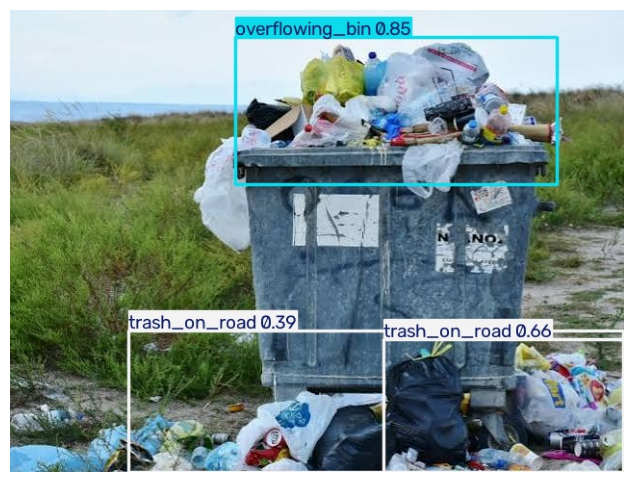

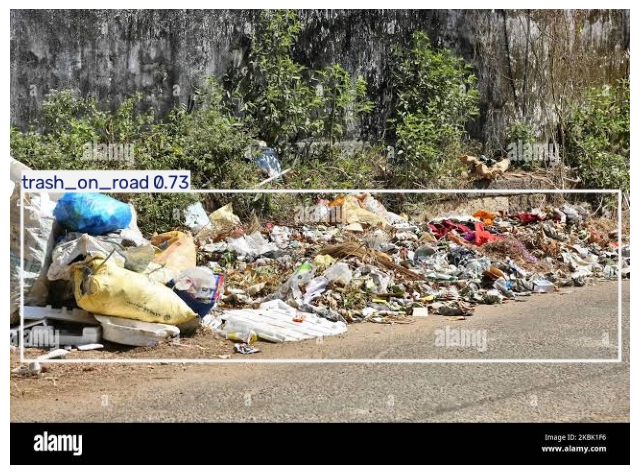

In [57]:
import os
from PIL import Image
import matplotlib.pyplot as plt

folder = "/content/runs/detect/predict-2"

images = [
    os.path.join(folder, f)
    for f in os.listdir(folder)
    if f.lower().endswith((".jpg", ".jpeg", ".png", ".webp"))
]

print("Total images:", len(images))

for image_path in images:
    img = Image.open(image_path)

    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.axis("off")
    plt.show()